<a href="https://colab.research.google.com/github/onyekaokonji/Bacteria-Segmentation/blob/main/Bacteria_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.layers import Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, Cropping2D, Input, Dropout
from keras.models import Model

In [2]:
os.environ['KAGGLE_USERNAME'] = "lorddexter"
os.environ['KAGGLE_KEY'] = "ff52926f38f3ec1bb29c339e91ad8b72"
! kaggle datasets download -d longnguyen2306/bacteria-detection-with-darkfield-microscopy
! unzip bacteria-detection-with-darkfield-microscopy.zip

 99% 160M/162M [00:02<00:00, 103MB/s] 
100% 162M/162M [00:02<00:00, 74.4MB/s]
Archive:  bacteria-detection-with-darkfield-microscopy.zip
  inflating: images/001.png          
  inflating: images/002.png          
  inflating: images/003.png          
  inflating: images/004.png          
  inflating: images/005.png          
  inflating: images/006.png          
  inflating: images/007.png          
  inflating: images/008.png          
  inflating: images/009.png          
  inflating: images/010.png          
  inflating: images/011.png          
  inflating: images/012.png          
  inflating: images/013.png          
  inflating: images/014.png          
  inflating: images/015.png          
  inflating: images/016.png          
  inflating: images/017.png          
  inflating: images/018.png          
  inflating: images/019.png          
  inflating: images/020.png          
  inflating: images/021.png          
  inflating: images/022.png          
  inflating: images/023.png

In [3]:
images_path = '/content/images'
masks_path = '/content/masks'

In [4]:
images = []
masks = []

for img_path, msk_path in zip(os.listdir(images_path), os.listdir(masks_path)):
  img = os.path.join(images_path, img_path)
  img = cv2.imread(img)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  
  msk = os.path.join(masks_path, msk_path)
  msk = cv2.imread(msk)
  msk = cv2.cvtColor(msk, cv2.COLOR_BGR2GRAY)

  img_copy = img.copy()
  img_copy[msk == 1] = [255, 0, 0]
  img_copy[msk == 2] = [0, 0, 255]

  second_img_copy = img.copy()
  Blended_image = cv2.addWeighted(img_copy, 0.5, second_img_copy, 0.5, 0)

  img = cv2.resize(img, (128,128))
  images.append(img)

  mask = cv2.resize(Blended_image, (128,128))
  masks.append(mask)

# converting images and masks to numpy arrays and rescaling
images = np.array(images, dtype = 'float32')
masks = np.array(masks, dtype = 'float32')

In [5]:
def display(display_list,titles=[], display_string=None):
  '''displays a list of images/masks'''

  plt.figure(figsize=(15, 15))

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
    if display_string and i == 1:
      plt.xlabel(display_string, fontsize=12)
    img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
    plt.imshow(img_arr)
  
  plt.show()

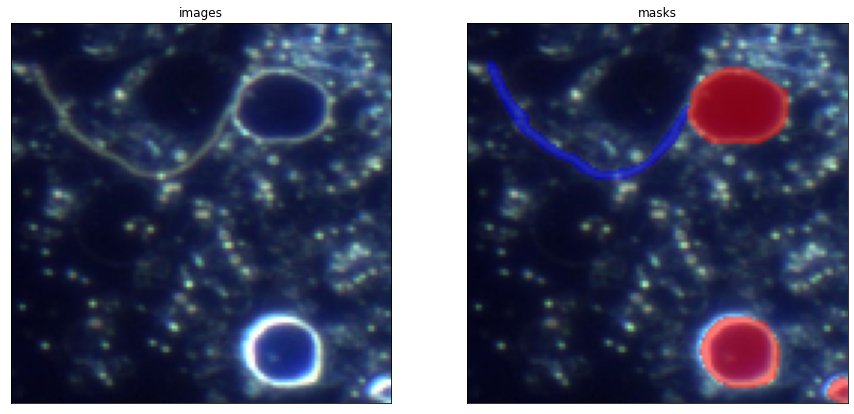

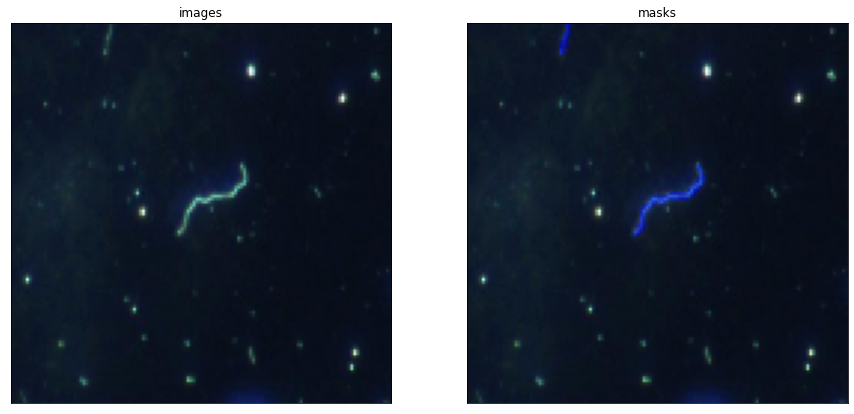

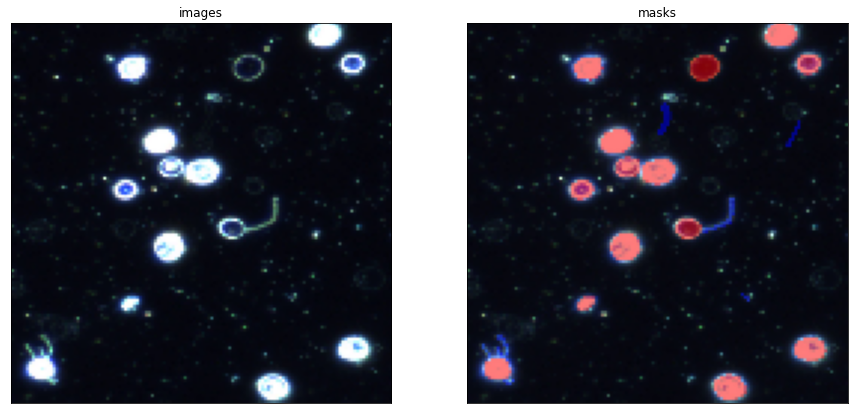

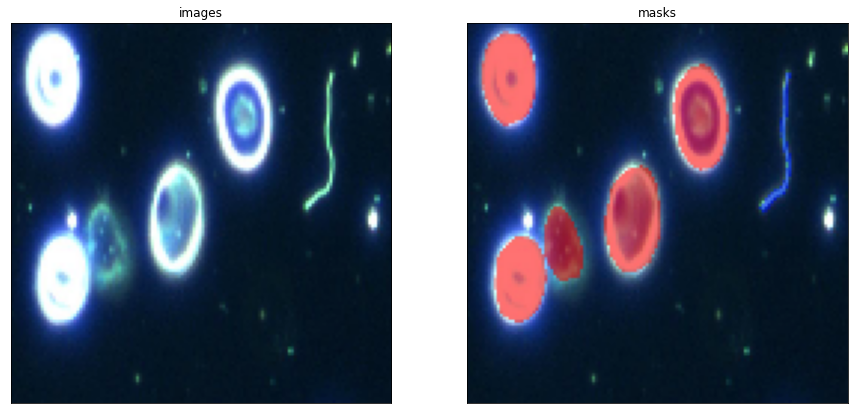

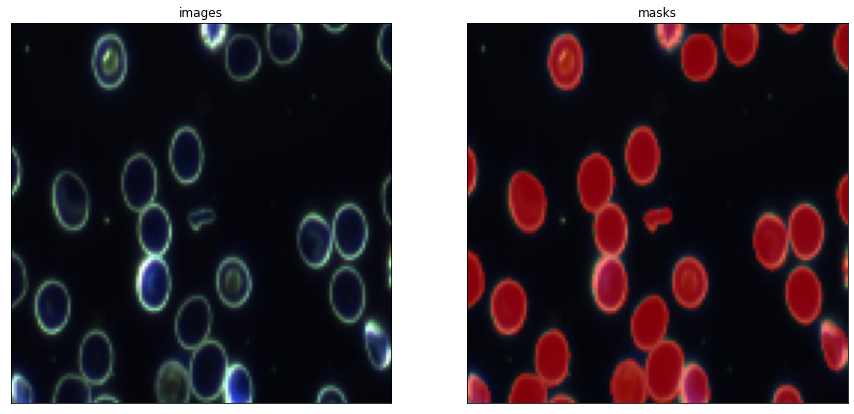

...

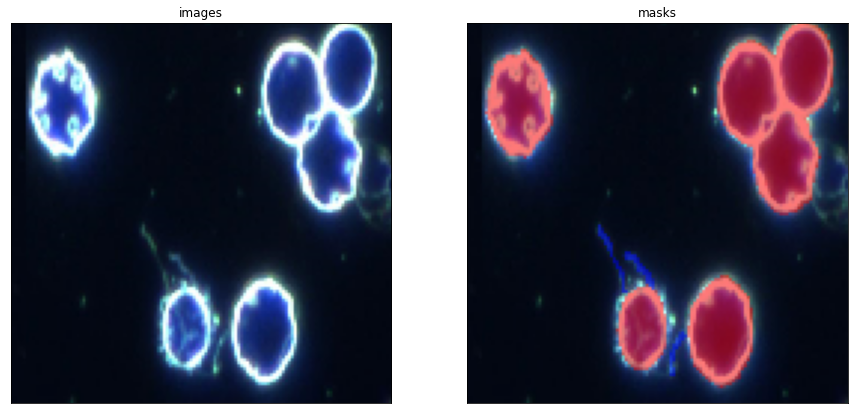

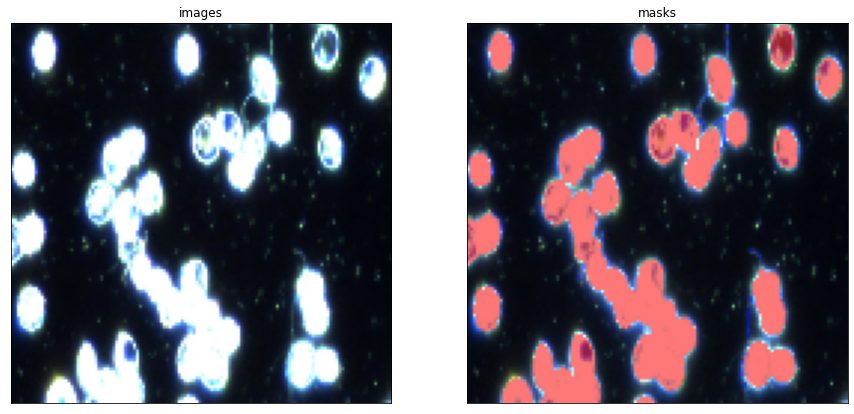

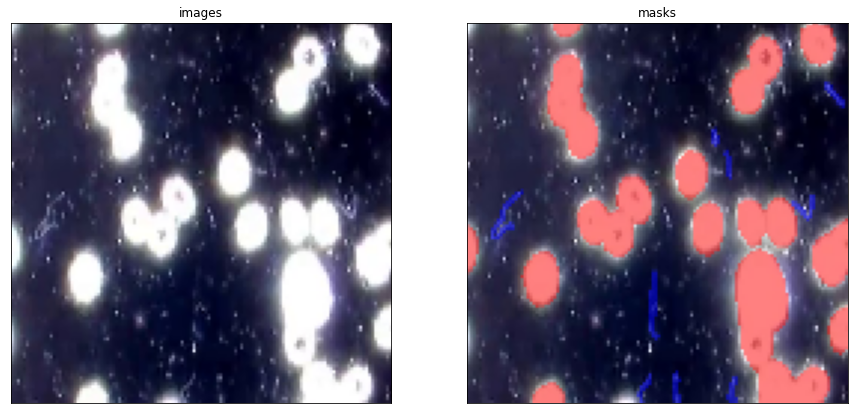

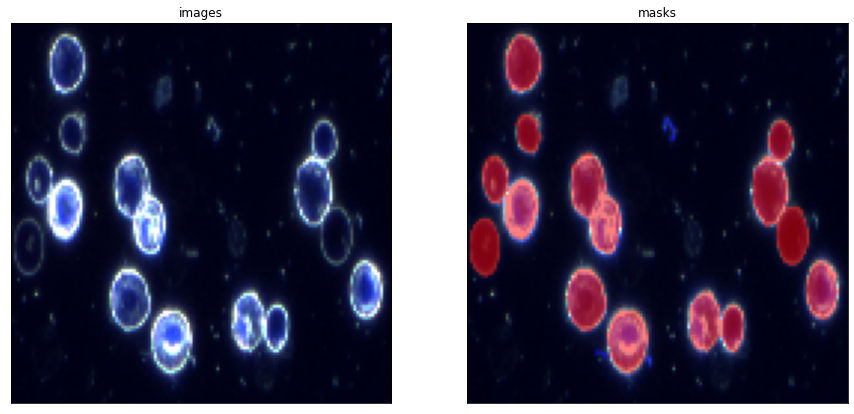

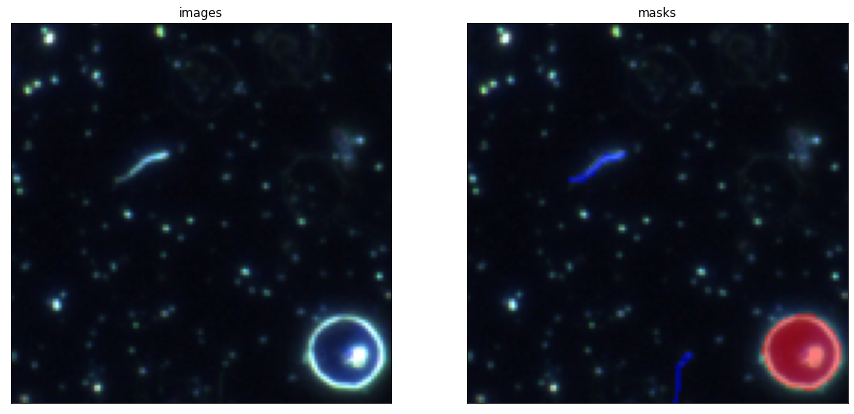

In [6]:
for img, msk in zip(images[:20], masks[:20]):
  display(display_list = [img, msk], titles = ['images', 'masks'])

In [7]:
print(images.shape)

print(masks.shape)

(366, 128, 128, 3)
(366, 128, 128, 3)


In [8]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=30,
                                                                 horizontal_flip=True,
                                                                 vertical_flip=True,
                                                                 validation_split=0.2,
                                                                 rescale = 1/255.0)

train_images_datagen = data_generator.flow(x = images, subset = 'training', seed = 1)
train_mask_datagen = data_generator.flow(x = masks, subset = 'training', seed = 1)
train_dataset = zip(train_images_datagen, train_mask_datagen)

validation_images_datagen = data_generator.flow(x = images, subset = 'validation', seed = 1)
validation_mask_datagen = data_generator.flow(x = masks, subset = 'validation', seed = 1)
validation_dataset = zip(validation_images_datagen, validation_mask_datagen)

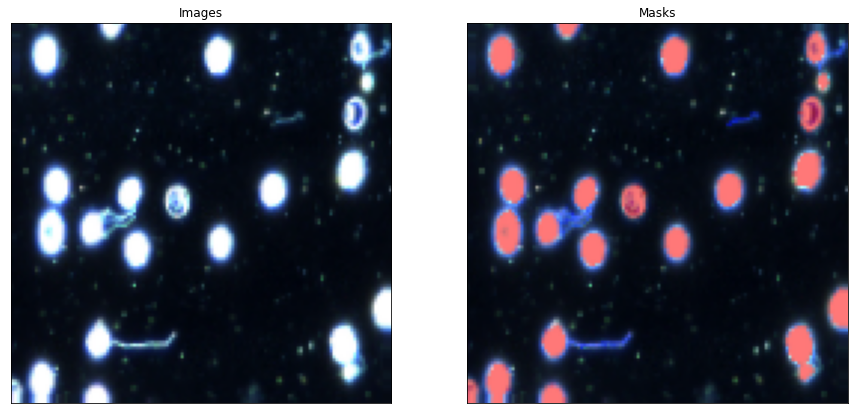

In [9]:
imgs, msks = train_dataset.__next__()
display(display_list = [imgs[0], msks[0]], titles =['Images', 'Masks'])

In [10]:
# let's create a conv block of 3 convolutions and a Relu activation to make drawing model architecture easier
def conv_block(input_tensor, kernel_size, n_filters):

  """
  outputs will be two tensors one (p) of which is the product of the MaxPooling 
  and is sent to the next conv block 
  while the other (c) which is a product of successive convolutions 
  is used as a bye-product 
  to be concatenated with the decoder end of the U-Net

  """
  x = input_tensor
  c = Conv2D(kernel_size = kernel_size, filters = n_filters, padding = 'same', activation = 'relu', kernel_initializer = 'he_normal')(x)
  c = Conv2D(kernel_size = kernel_size, filters = n_filters, padding = 'same', activation = 'relu', kernel_initializer = 'he_normal')(c)
  p = MaxPooling2D(pool_size = (2,2))(c)
  p = Dropout(0.3)(p)

  return c, p

In [11]:
# defining the encoder end of the U-Net architecture
def encoder(input):

  """
  this will merge successive conv blocks to form the encoder end of the architecture
  one output of the conv block is sent to the successive block while the other is kept aside
  to be concatenated with the decoder block later. The returned output is the final output
  and the side-products.

  encoder comprises 4 convolutional blocks

  """
  c1, p1 = conv_block(input, (3,3), 64)
  c2, p2 = conv_block(p1, (3,3), 128)
  c3, p3 = conv_block(p2, (3,3), 256)
  c4, p4 = conv_block(p3, (3,3), 512)

  return p4, (c1, c2, c3, c4)

In [12]:
# define bottle-neck section of the u-net architecture
def bottle_neck(inputs):

  """
  in this case, it receives the output (p4) from the above function

  """

  x = inputs
  bottle_neck = Conv2D(kernel_size = (3,3), padding = 'same', filters = 1024, activation = 'relu', kernel_initializer = 'he_normal')(x)
  bottle_neck = Conv2D(kernel_size = (3,3), padding = 'same', filters = 1024, activation = 'relu', kernel_initializer = 'he_normal')(bottle_neck)
  
  return bottle_neck

In [13]:
# define upsample conv blocks
def conv_transpose_block(inputs, encoder_outputs, n_filters, kernel_size, strides):

  """
  Takes the two outputs from the encoder layers, upsamples one, crops the other
  and concatenates with the output of the upsampled layer then successive
  convolutions and relus

  """
  
  x = inputs
  x = Conv2DTranspose(filters = n_filters, kernel_size = kernel_size, strides = strides, padding = 'same')(x)
  c = concatenate([x, encoder_outputs])
  c = Dropout(0.3)(c)
  c = Conv2D(filters = n_filters, kernel_size = (3,3), padding = 'same', activation = 'relu', kernel_initializer = 'he_normal')(c)
  c = Conv2D(filters = n_filters, kernel_size = (3,3), padding = 'same', activation = 'relu', kernel_initializer = 'he_normal')(c)

  return c

In [14]:
# defining the decoder block
def decoder(inputs, encoder_side_outputs, n_output):
  """
  joins together several conv_transpose blocks to make the decoder layer
  
  """
  c1, c2, c3, c4 = encoder_side_outputs

  d = conv_transpose_block(inputs, c4, 512, (3,3), (2,2))
  d = conv_transpose_block(d, c3, 256, (3,3), (2,2))
  d = conv_transpose_block(d, c2, 128, (3,3), (2,2))
  d = conv_transpose_block(d, c1, 64, (3,3), (2,2))

  output = Conv2D(kernel_size = (1,1), filters = n_output, activation = 'sigmoid')(d)

  return output

In [15]:
# defining the u-net architecture
n_output = 3

def u_net():
  input_tensor = Input(shape = (128, 128, 3))
  encoder_output, encoder_side_outputs = encoder(input_tensor)
  bottle_neck_feature = bottle_neck(encoder_output)
  output = decoder(bottle_neck_feature, encoder_side_outputs, n_output)

  model = Model(input_tensor, output)

  return model

In [16]:
model = u_net()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 128, 128, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

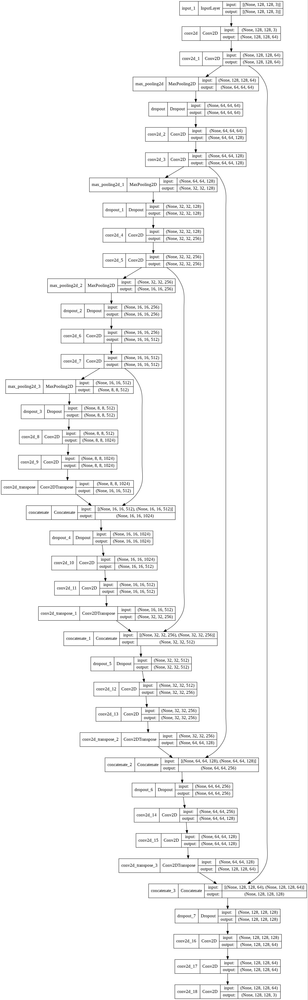

In [17]:
tf.keras.utils.plot_model(model, 'u-net.jpg', show_shapes = True)

In [18]:
model.compile(optimizer = tf.keras.optimizers.Adam(), metrics = ['accuracy', tf.keras.metrics.Precision(thresholds = 0.8), tf.keras.metrics.Recall()], loss = 'binary_crossentropy')

In [19]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy', patience = 15, baseline = 0.95)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'loss', factor = 0.1, patience = 20, min_lr = 0.0001)

In [20]:
model_history = model.fit(x = train_dataset, epochs = 300, steps_per_epoch = 10, callbacks = [early_stopping, reduce_lr])

Epoch 1/300
10/10 [==============================] - 436s 43s/step - loss: 2.8762 - accuracy: 0.3683 - precision: 0.9994 - recall: 0.1882 - lr: 0.0010
Epoch 2/300
10/10 [==============================] - 431s 43s/step - loss: 0.6626 - accuracy: 0.6718 - precision: 1.0000 - recall: 0.2550 - lr: 0.0010
Epoch 3/300
10/10 [==============================] - 432s 43s/step - loss: 0.6296 - accuracy: 0.6032 - precision: 1.0000 - recall: 0.0619 - lr: 0.0010
Epoch 4/300
10/10 [==============================] - 431s 43s/step - loss: 0.5716 - accuracy: 0.7417 - precision: 1.0000 - recall: 0.0396 - lr: 0.0010
Epoch 5/300
10/10 [==============================] - 430s 43s/step - loss: 0.4771 - accuracy: 0.7276 - precision: 1.0000 - recall: 0.0736 - lr: 0.0010
Epoch 6/300
10/10 [==============================] - 434s 43s/step - loss: 0.4487 - accuracy: 0.8034 - precision: 1.0000 - recall: 0.0630 - lr: 0.0010
Epoch 7/300
10/10 [==============================] - 434s 43s/step - loss: 0.4077 - accuracy: 

In [21]:
validation_images, valiidation_masks = validation_dataset.__next__()
predicted_masks = model.predict(validation_images)

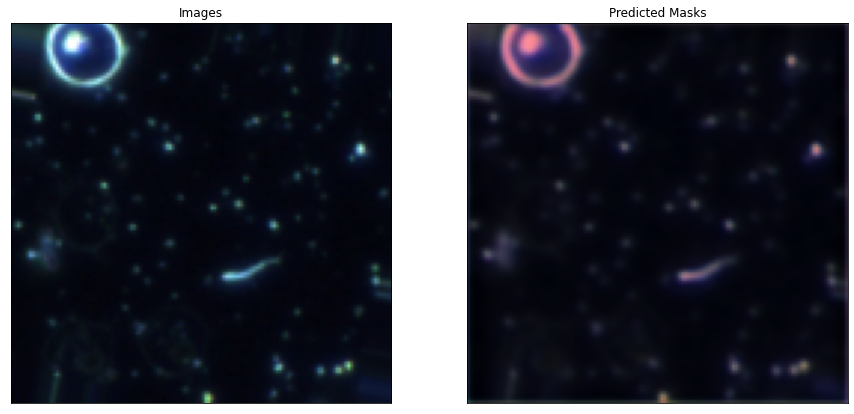

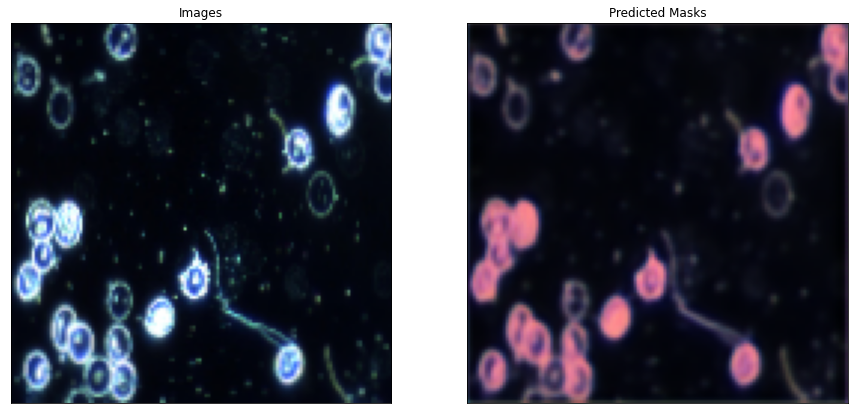

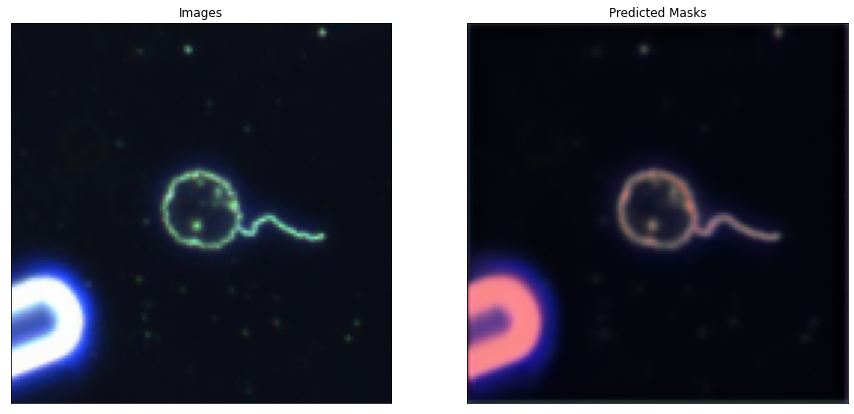

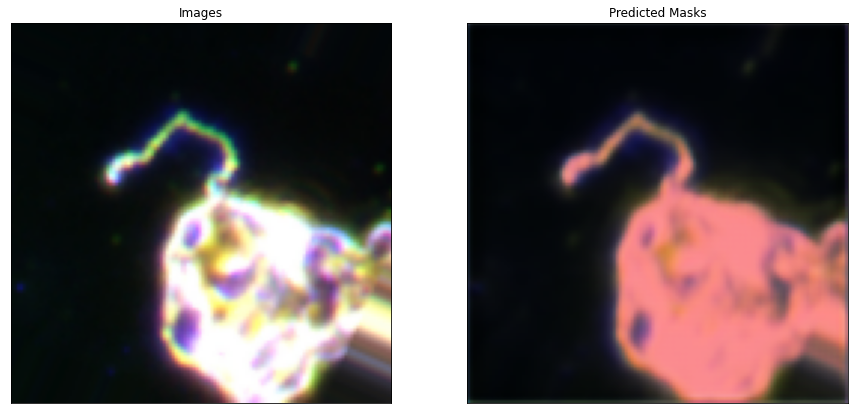

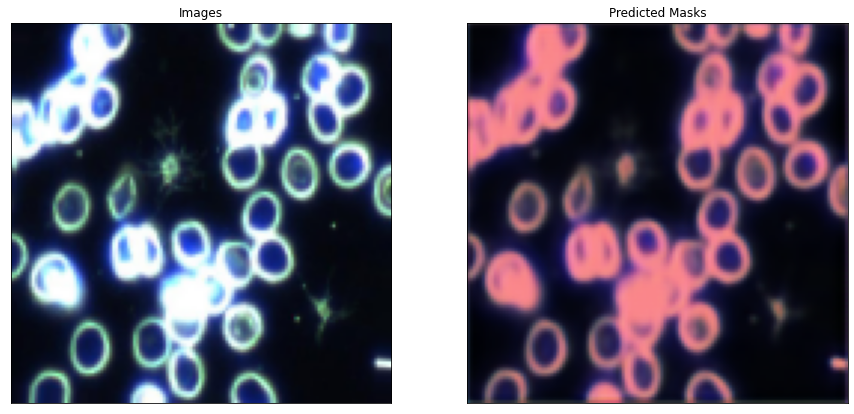

...

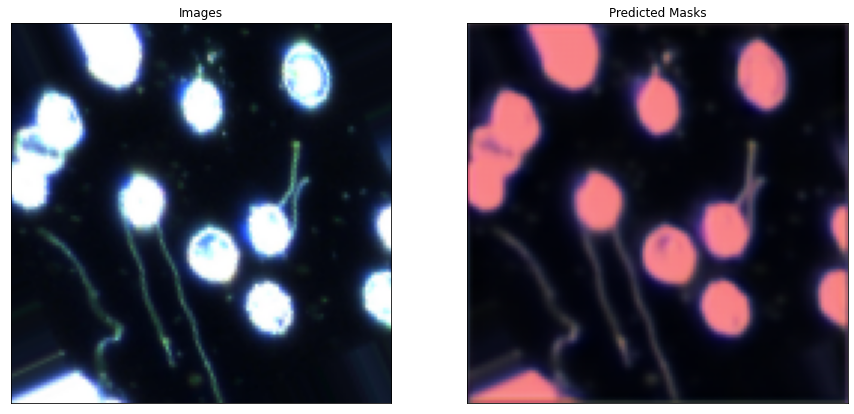

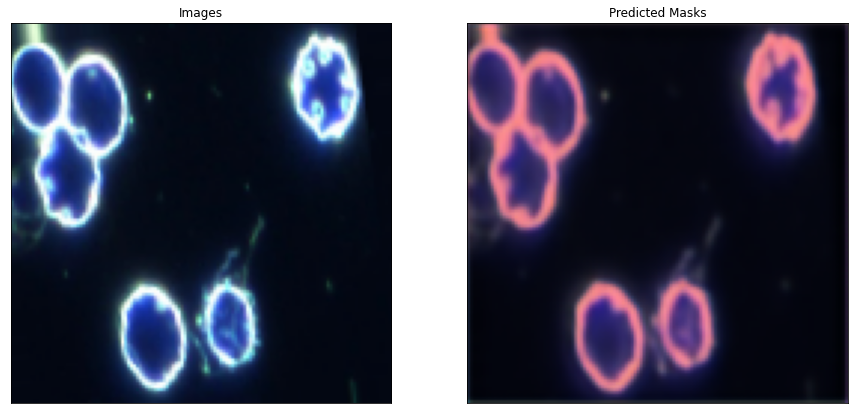

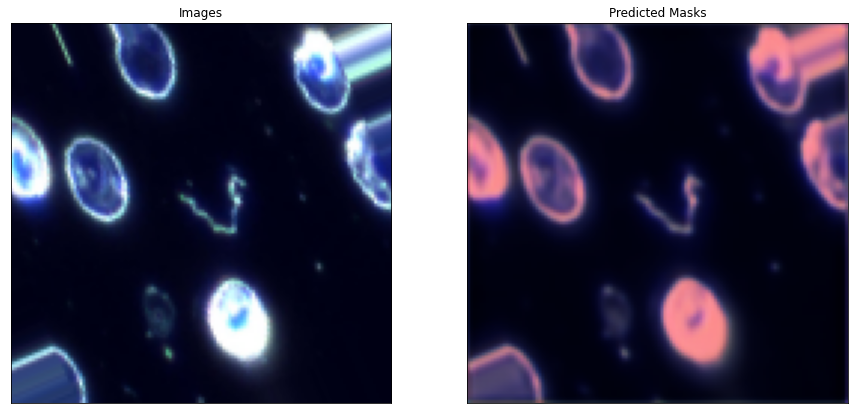

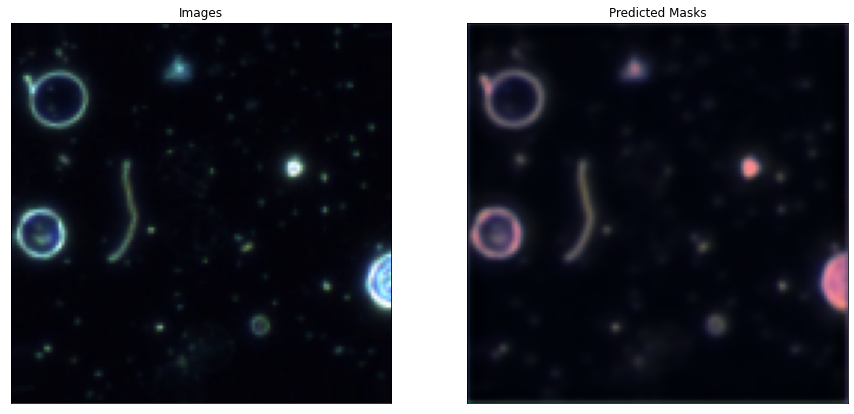

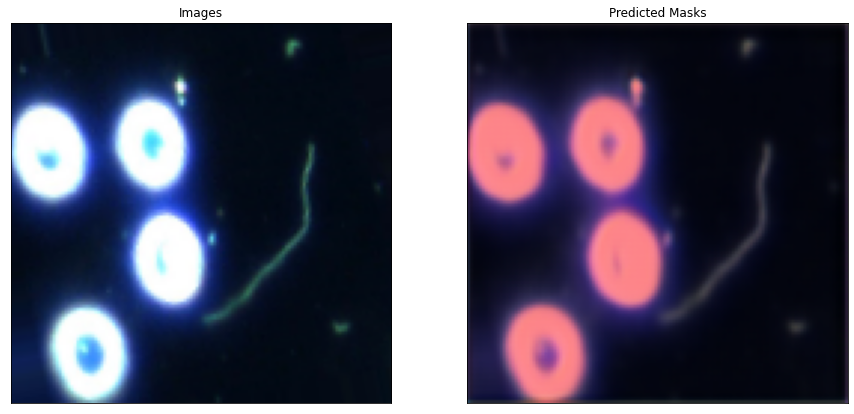

In [24]:
for img, msk in zip(validation_images[:20], predicted_masks[:20]):
  display(display_list = [img, msk], titles = ['Images', 'Predicted Masks'])